# Demonstration of Augmentater

In [1]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path

import sys
sys.path.append("..")

from modules.rectification.augmentation import Augmenter

from IPython.display import display, HTML

# Force Jupyter to NEVER use scrolling for output cells
display(HTML("""
    <style>
        .output_scroll { height: auto !important; }
        .jp-OutputArea-output { overflow: visible !important; }
    </style>
"""))


---

#### **Task 4: Assignment Instructions:**
1. Define augmenter parameters (i.e., `kwargs = {'image': image, ...}`)
2. Initialize Augmenter
3. Display and demonstrate the following features by displaying 5 images for each method.
    - horizontal_flip
    - gaussian_blur
    - resize
    - change_brightness
    - transform
    - "your_custom_transformation"
4. Measure the loss for each of these transformation, and note any observations. 

**Reminder:**  
- Your notebook should be well-structured and clear for effective presentation. Up to 10 points may be deducted for poor structure and clarity.
- Consider this report as if it were being reviewed by **TechTrack stakeholders**. Keep it professional, insightful, and visually organized!
- Use visualizations, tables, and quantitative analysis where applicable to support your findings.

In [2]:

# Function to display images
def show_images(original, augmented, title="Augmentation Result"):
    """
    Displays the original and augmented images side by side.
    
    :param original: Original image before augmentation.
    :param augmented: Augmented image after applying transformations.
    :param title: Title of the plot.
    """
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    
    axes[0].imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image")
    axes[0].axis("off")
    
    axes[1].imshow(cv2.cvtColor(augmented, cv2.COLOR_BGR2RGB))
    axes[1].set_title(title)
    axes[1].axis("off")
    
    plt.show()

In [3]:
# Load a sample image for augmentation testing
image_path = "../storage/sample_image.jpg"  
image = cv2.imread(image_path)

if image is None:
    raise ValueError(f"Could not load image from {image_path}")

### Demonstration: Included Transformations on One Sample Image

**Note: Keyword arguments were defined in the script for the Augmeter class in augmentation.py ...they can be called with different values but I used default values so they don't appear here**

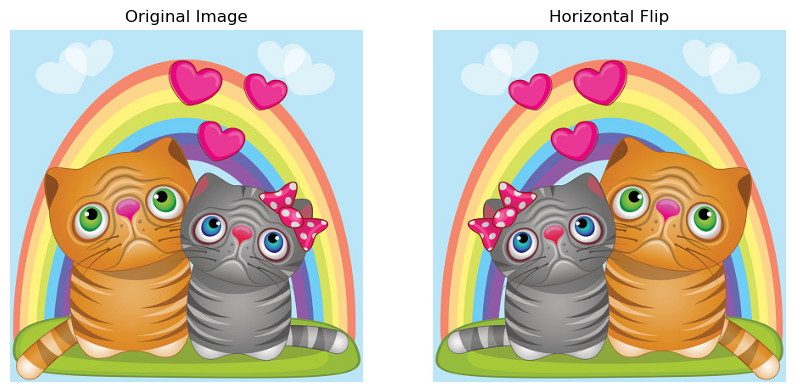

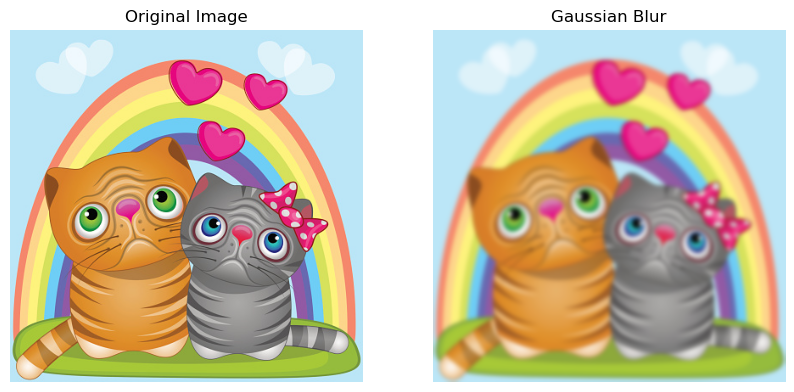

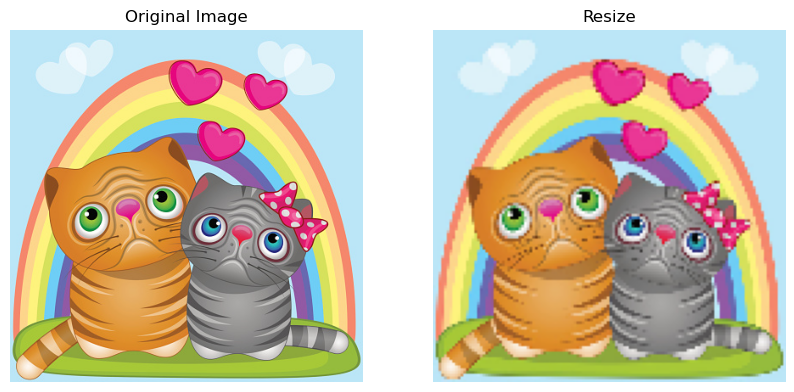

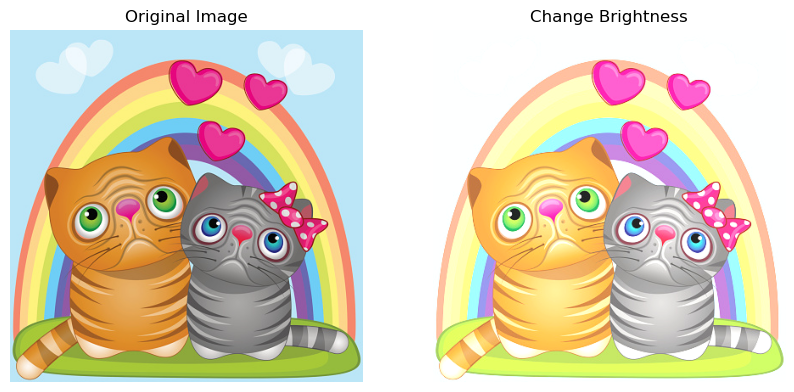

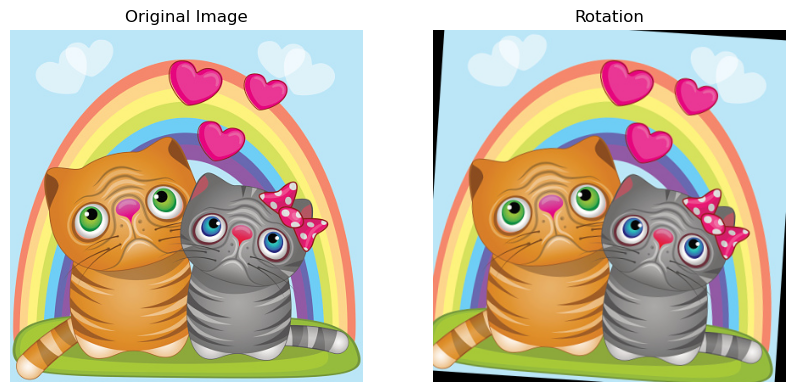

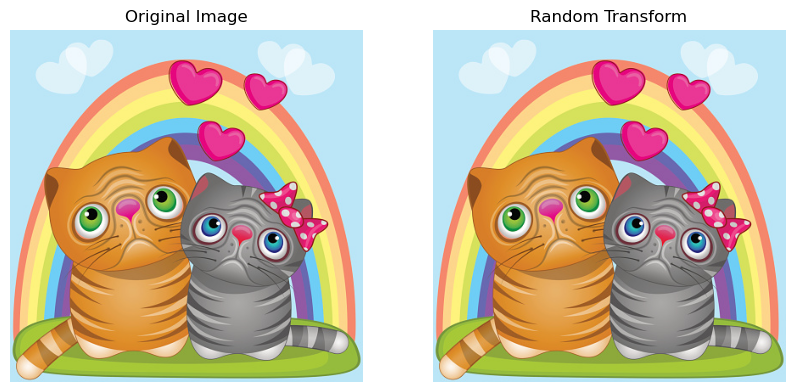

In [4]:

# Define augmentation tests
augmentation_methods = {
    "Horizontal Flip": Augmenter.horizontal_flip,
    "Gaussian Blur": Augmenter.gaussian_blur,
    "Resize": Augmenter.resize,
    "Change Brightness": Augmenter.change_brightness,
    "Rotation": Augmenter.rotate,
    "Random Transform": Augmenter.transform
}

# Apply and visualize each augmentation method with my sample image
for aug_name, aug_func in augmentation_methods.items():
    augmented_image = aug_func(image)
    show_images(image, augmented_image, title=aug_name)

## Use of SSIM for a Similarity Metric

**Structural Similarity Index (SSIM)** is a perceptual metric used to measure the similarity between two images by evaluating differences in luminance, contrast, and structure. Unlike simple pixel-wise differences, SSIM models human visual perception, making it more robust in assessing image quality changes. In our analysis, we compute SSIM between the original and augmented images to quantify how much each transformation alters the image. A **high SSIM (close to 1.0)** means the augmentation preserves most structural details, while a **low SSIM indicates significant distortion**. This helps us understand which augmentations introduce **minimal changes (e.g., horizontal flip)** and which heavily impact the model’s perception (e.g., Gaussian blur or extreme resizing). 

In [6]:
import cv2
import numpy as np

def compute_ssim_manual(image1, image2):
    """
    Computes Structural Similarity Index (SSIM) manually using OpenCV and NumPy.

    :param image1: First image (NumPy array).
    :param image2: Second image (NumPy array).
    :return: SSIM score (between -1 and 1, where 1 is identical).
    """
    # Ensure both images have the same dimensions
    h, w = image1.shape[:2]
    image2 = cv2.resize(image2, (w, h))  # Resize augmented image to match the original

    # Convert to grayscale
    gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

    # Constants to stabilize division
    C1, C2 = (6.5025, 58.5225)

    # Compute mean (luminance)
    mu1, mu2 = np.mean(gray1), np.mean(gray2)

    # Compute variance (contrast)
    sigma1_sq, sigma2_sq = np.var(gray1), np.var(gray2)

    # Compute covariance (structure)
    sigma12 = np.mean((gray1 - mu1) * (gray2 - mu2))

    # Compute SSIM
    ssim = ((2 * mu1 * mu2 + C1) * (2 * sigma12 + C2)) / ((mu1**2 + mu2**2 + C1) * (sigma1_sq + sigma2_sq + C2))
    return round(ssim, 4)




# Apply an augmentation (Gaussian Blur as an example)
augmented_image = cv2.GaussianBlur(image, (5, 5), 0)

# Compute SSIM for the sample image
ssim_score = compute_ssim_manual(image, augmented_image)

# Prepare DataFrame for display
df_ssim = pd.DataFrame([["Gaussian Blur", ssim_score]], columns=["Augmentation", "SSIM Score"])

# Display results in Jupyter Notebook
from IPython.display import display

# Show DataFrame with SSIM Scores
print("**SSIM Score on Sample Image**")
display(df_ssim)



**SSIM Score on Sample Image**


,Augmentation,SSIM Score
0,Gaussian Blur,0.9745


# Use of Variance as a Metric for Augmentation

Variance in our context measures the spread of pixel intensity values in an image, indicating how much the pixel values deviate from the mean. A high variance suggests that the image has strong contrasts and a wide range of pixel intensities, while a low variance indicates a more uniform or smoothed image. In our analysis, we compute variance for each augmented image to quantify how much an augmentation alters pixel distribution. Augmentations like Gaussian blur tend to reduce variance by smoothing pixel intensities, whereas transformations like brightness adjustments or strong contrast changes may increase variance. By comparing variance before and after augmentation, we gain insight into which transformations introduce significant changes that may impact the model’s ability to generalize. 

In [7]:
def compute_variance(image):
    """
    Computes variance of pixel intensities across all channels.
    
    :param image: Image (NumPy array).
    :return: Variance score.
    """
    return round(np.var(image), 2)

# Compute variance for different augmentations
variance_scores = {}
for aug_name, aug_func in augmentation_methods.items():
    augmented_image = aug_func(image)
    variance_scores[aug_name] = compute_variance(augmented_image)

# Display as a DataFrame
df_variance = pd.DataFrame(list(variance_scores.items()), columns=["Augmentation", "Variance Score"])

# Show DataFrame in Jupyter Notebook
print("**Augmentation Variance on the Sample Image**")
display(df_variance)



**Augmentation Variance on the Sample Image**


,Augmentation,Variance Score
0,Horizontal Flip,4148.74
1,Gaussian Blur,3449.46
2,Resize,4030.65
3,Change Brightness,3125.84
4,Rotation,6580.83
5,Random Transform,3468.00


[INFO] Processing Image: 702747af5e952697_jpg.rf.d37dd9d7b0e76c13d6b552816c4b5165.jpg


C:\Users\Putna\AppData\Local\Temp\ipykernel_6232\3844518490.py:102: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_results = pd.concat([df_results, new_row], ignore_index=True)


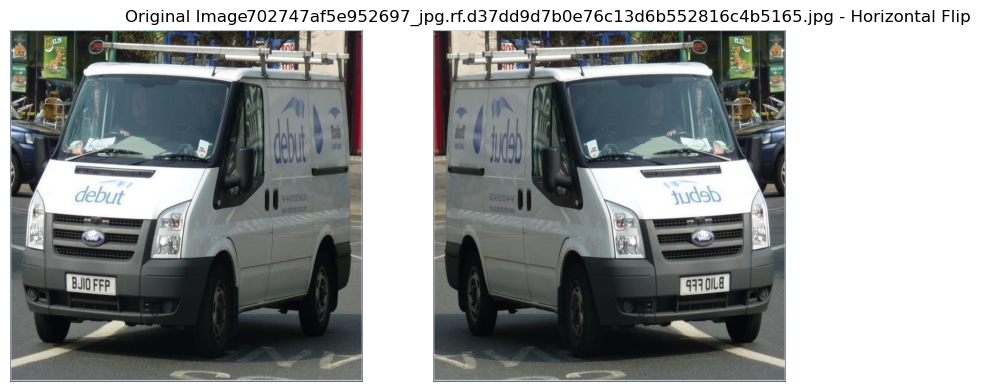

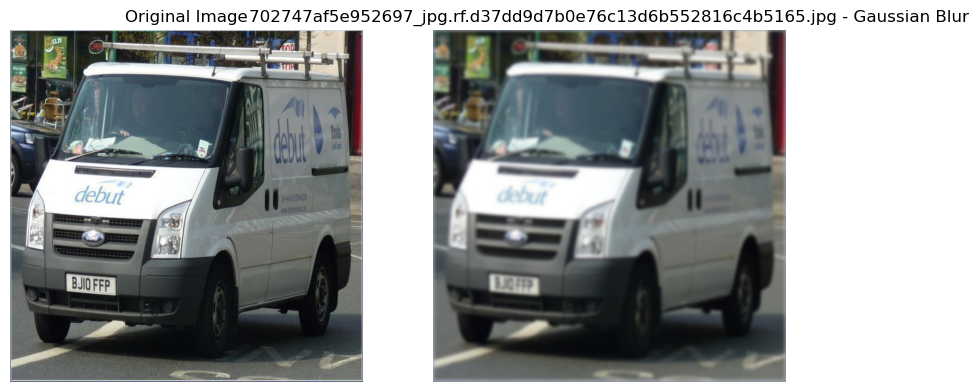

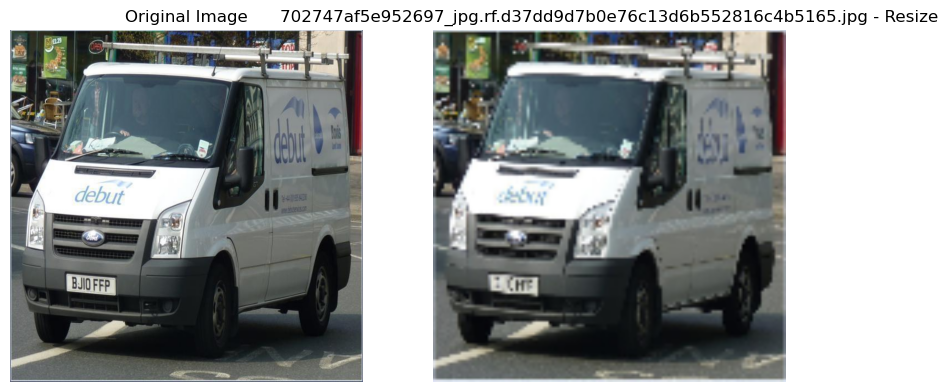

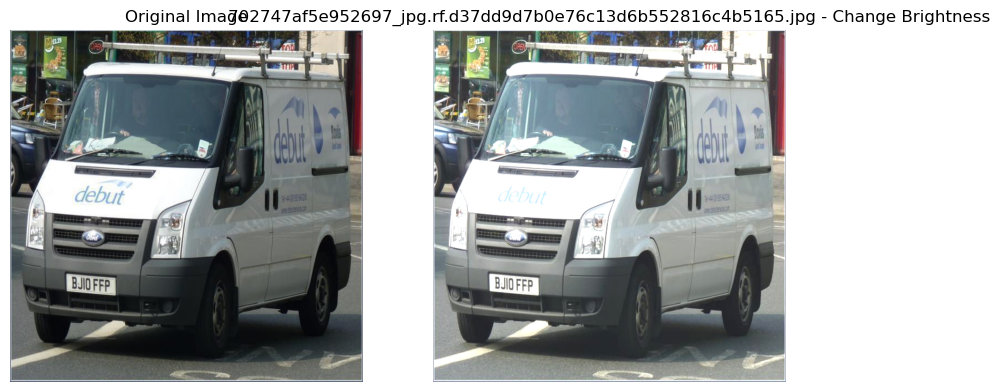

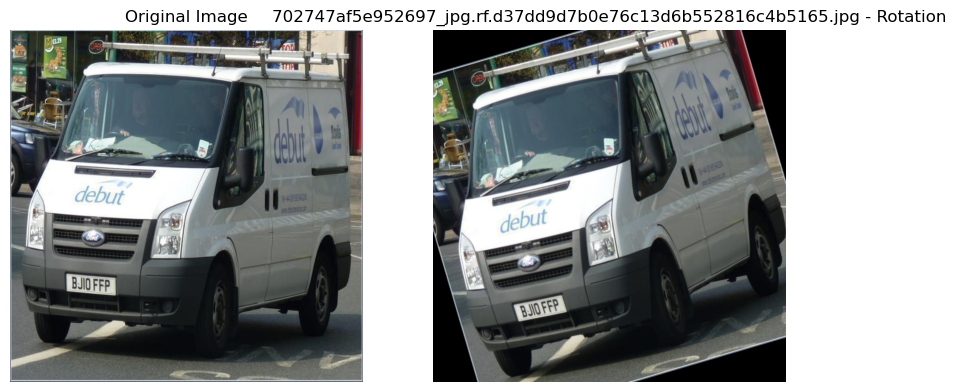

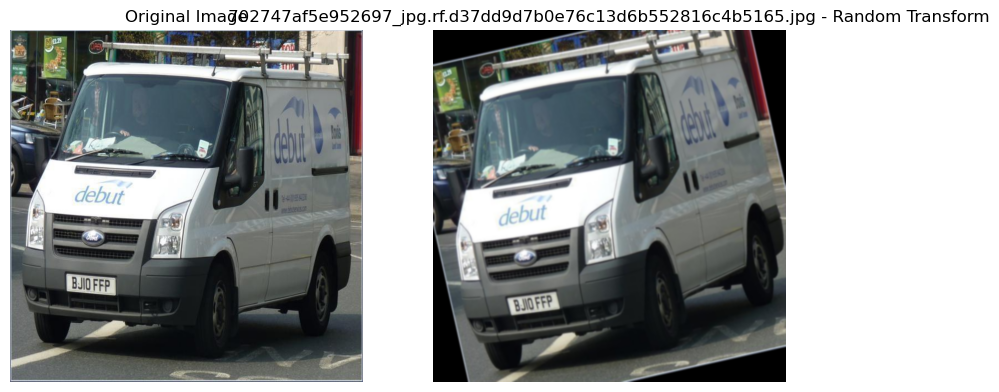

[INFO] Processing Image: fire14_mp4-1122_jpg.rf.93d7b084aae6ffd9cc010dc174726b8a.jpg


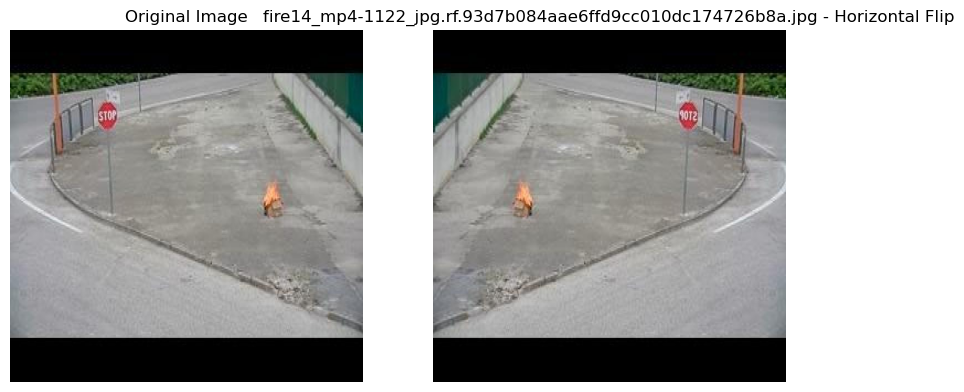

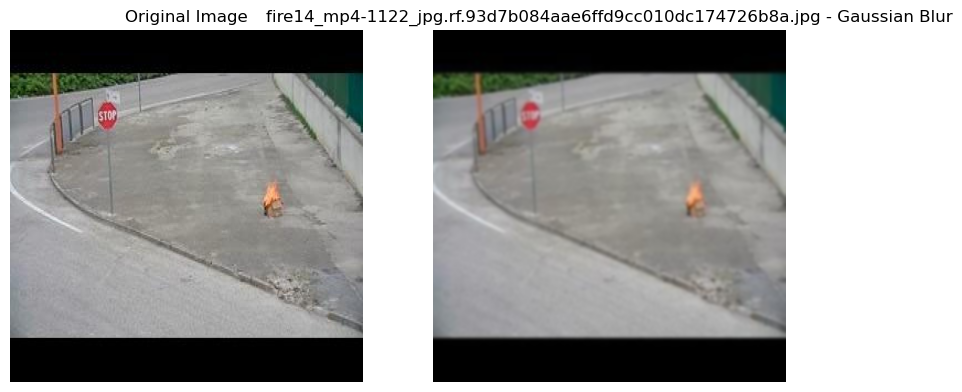

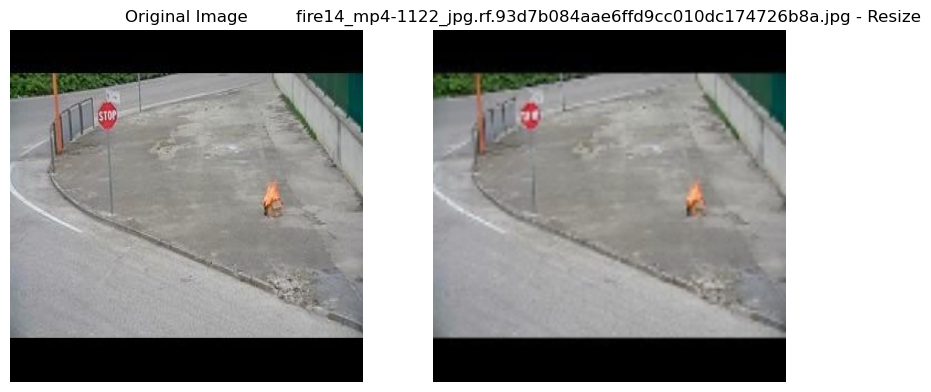

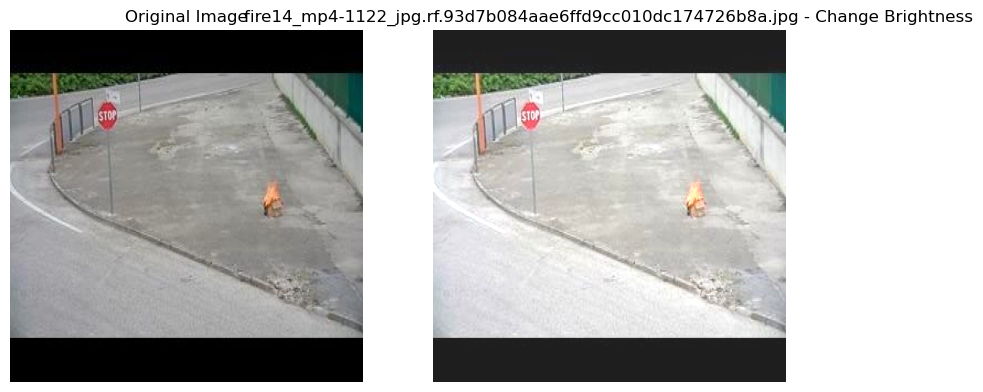

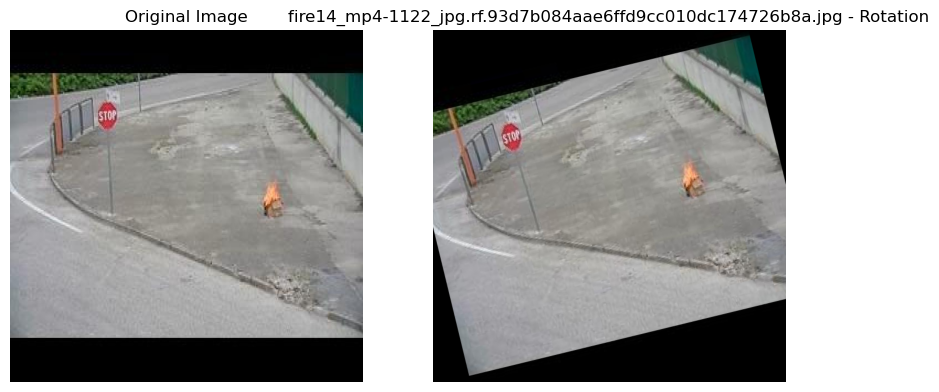

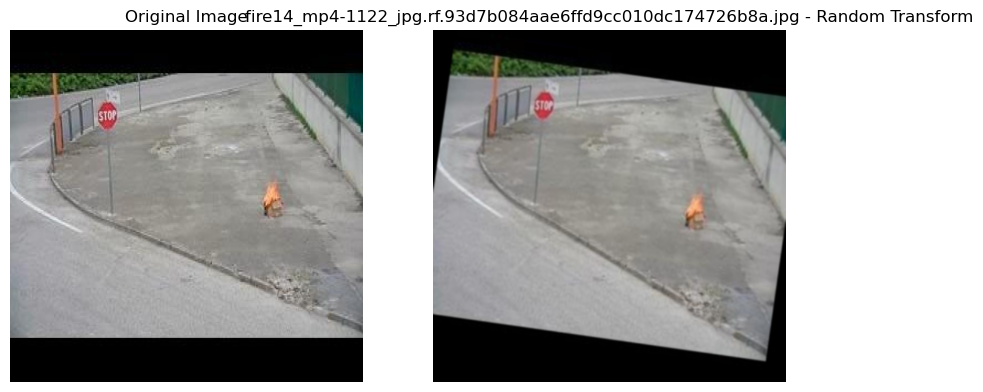

[INFO] Processing Image: traffic-light-912-_jpg.rf.b23900b443574dcddbd1edd2b9ef8cdf.jpg


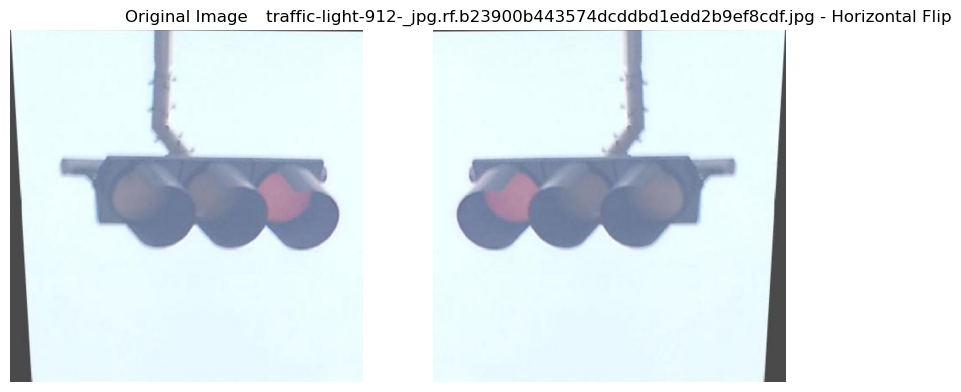

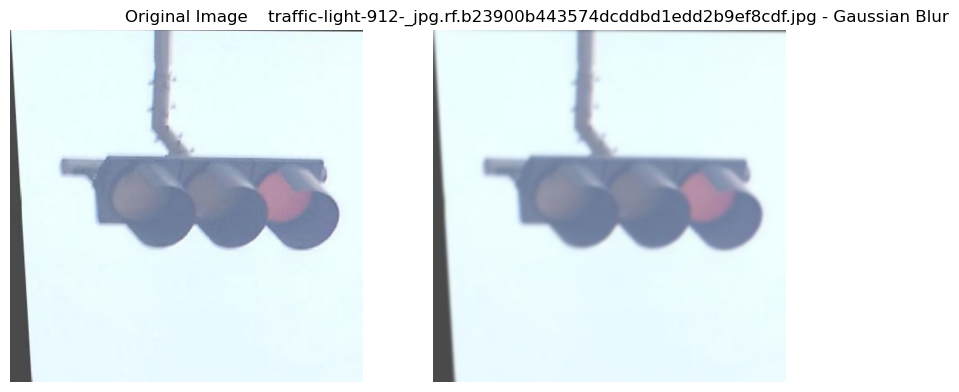

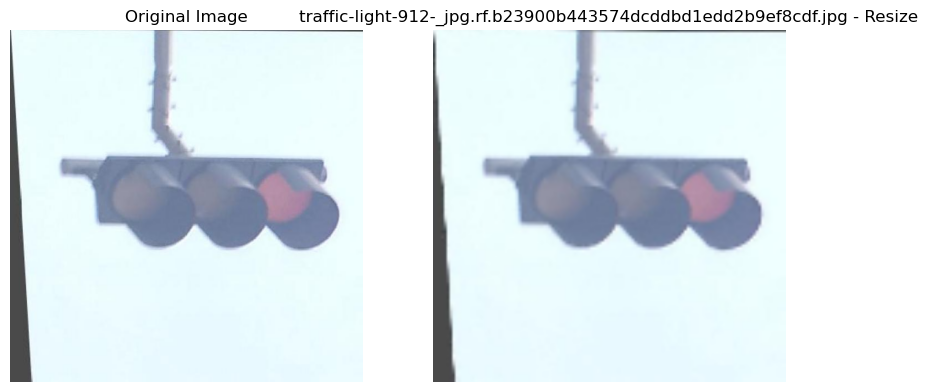

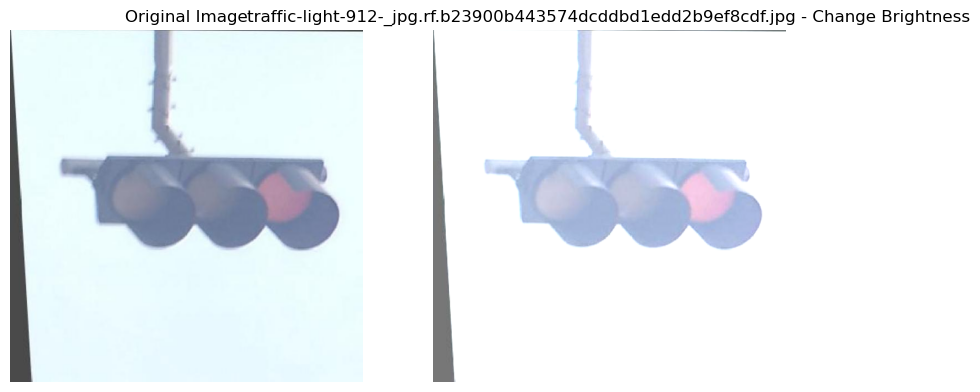

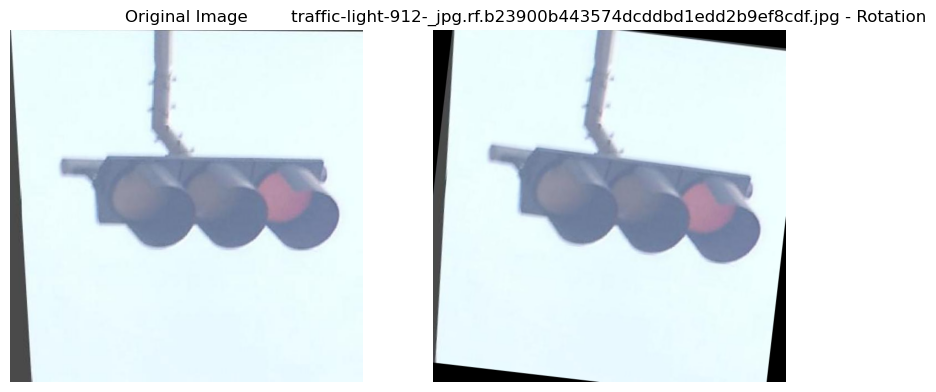

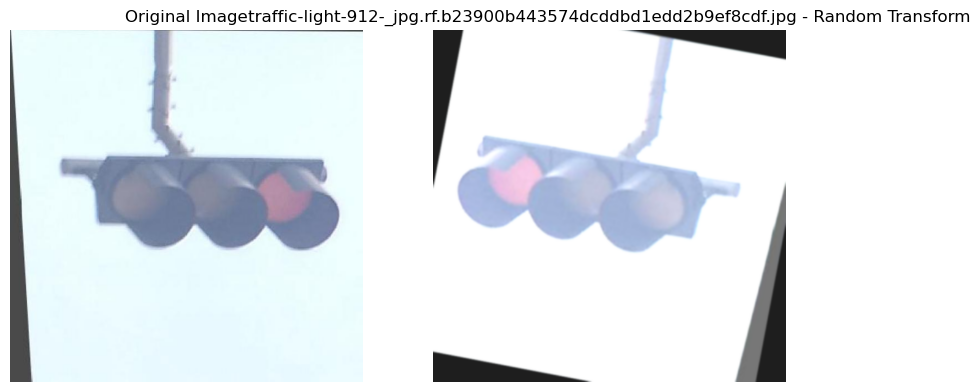

[INFO] Processing Image: a127_jpg.rf.7277fbce7151c51ce9530c3024a484bf.jpg


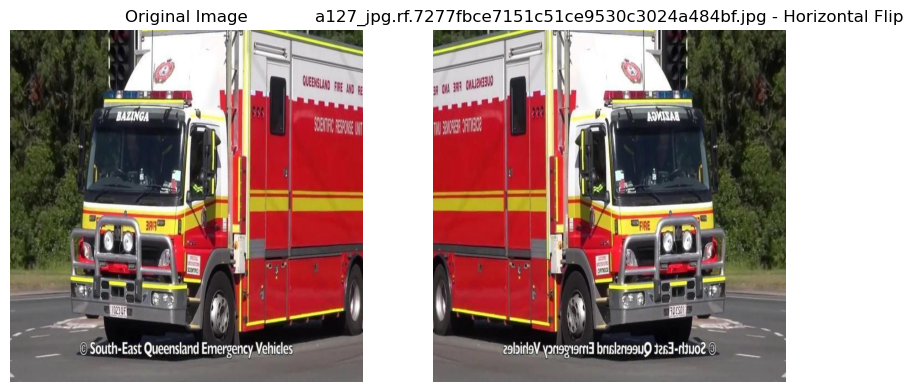

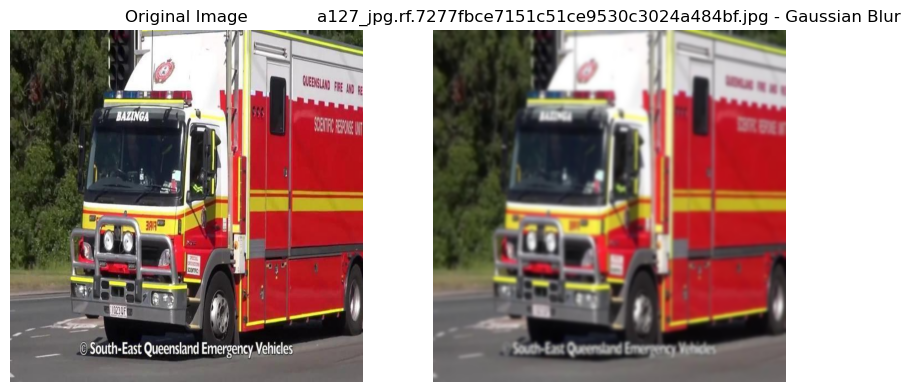

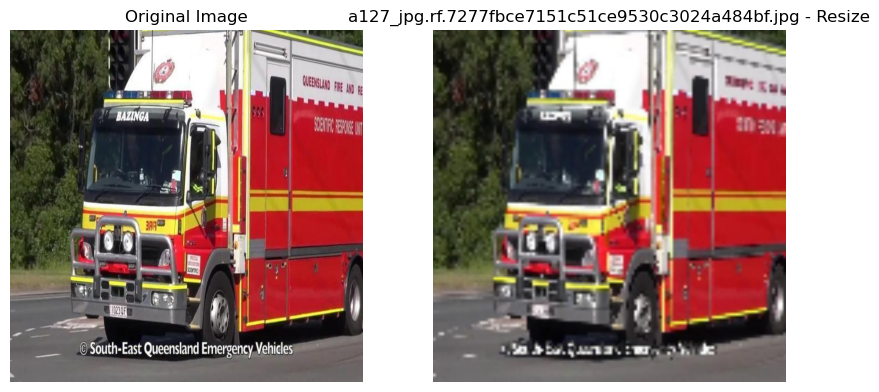

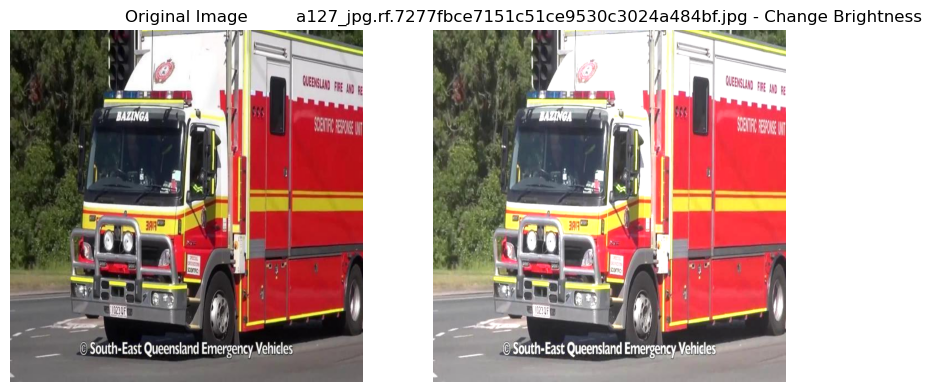

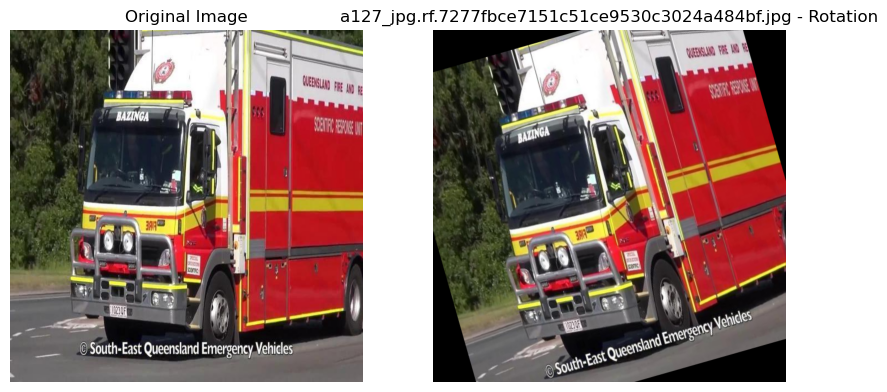

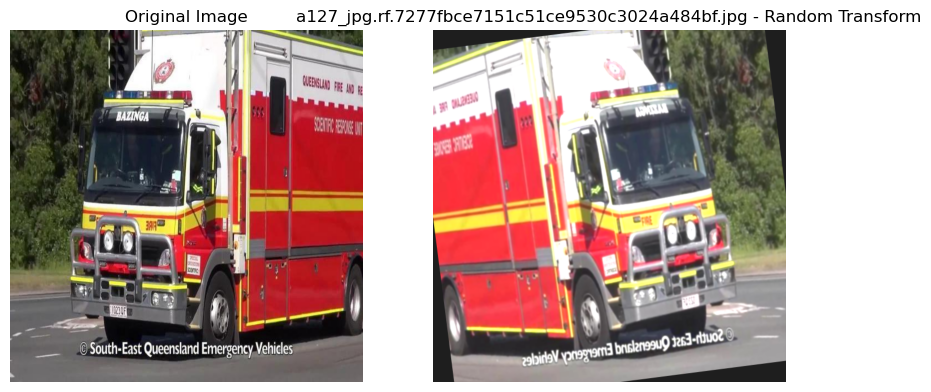

[INFO] Processing Image: fire22_mp4-2293_jpg.rf.d1fde516ba6d2e925d1bf0c223497221.jpg


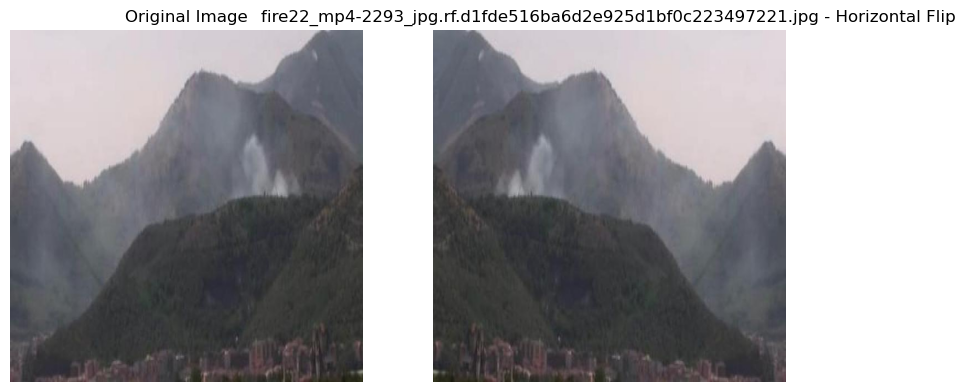

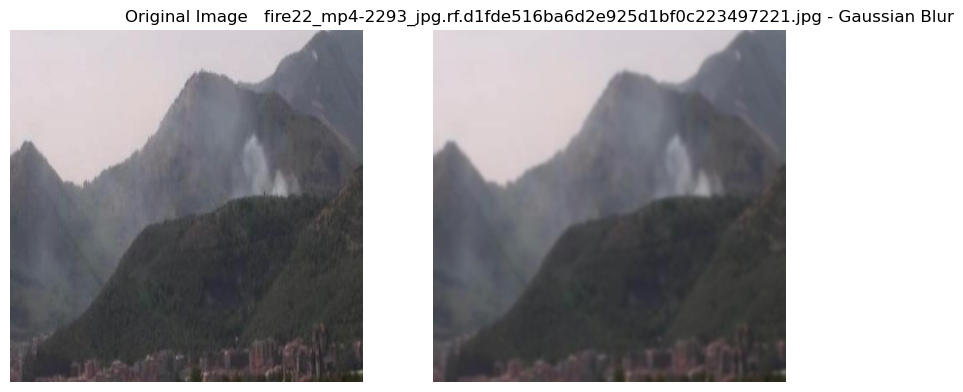

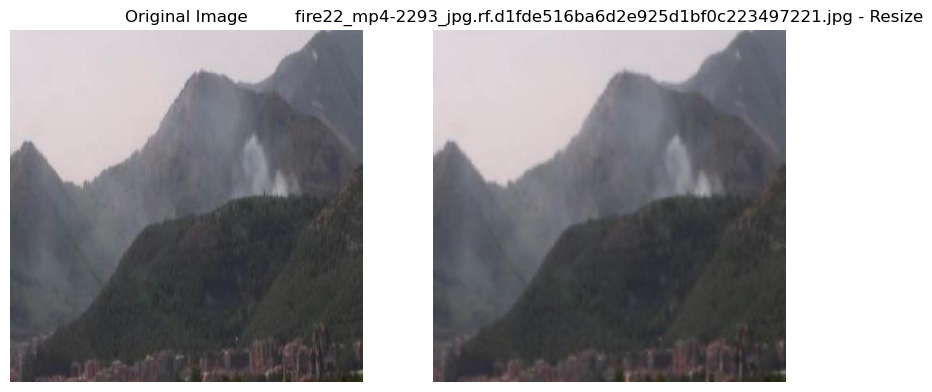

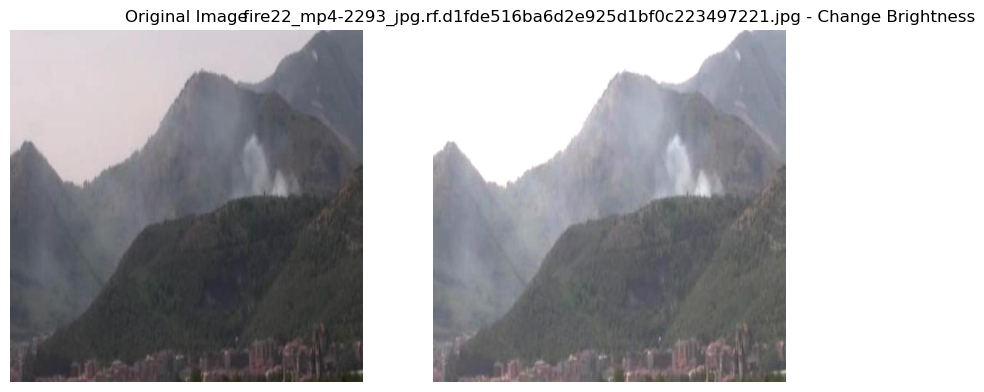

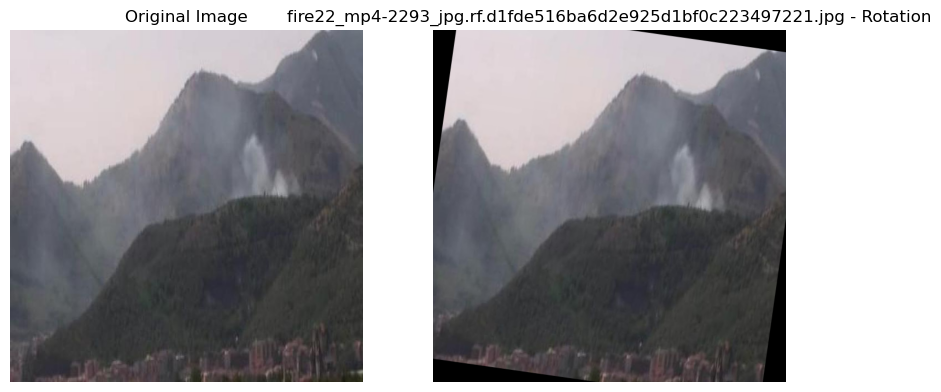

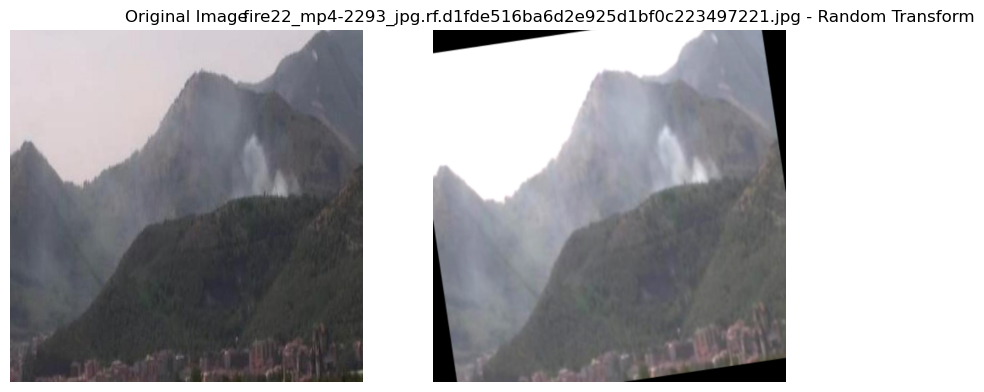

In [8]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
from IPython.display import display, HTML  # For full DataFrame display in Jupyter

# Import augmentation functions and Loss class
from modules.rectification.augmentation import Augmenter
from modules.utils.loss import Loss

# Force Jupyter to expand output instead of using scroll boxes
display(HTML("<style>.output_scroll { height: auto; }</style>"))

# Detect project root in a Jupyter Notebook
project_root = Path().resolve().parent  # Adjust depth if needed
logistics_folder = project_root / "storage/logistics"

# Get all .jpg images from the folder
all_images = [f for f in os.listdir(logistics_folder) if f.endswith(".jpg")]

# Select 5 random images
random_images = random.sample(all_images, 5)
random_image_paths = [logistics_folder / img for img in random_images]

# Define augmentation methods
augmentation_methods = {
    "Horizontal Flip": Augmenter.horizontal_flip,
    "Gaussian Blur": Augmenter.gaussian_blur,
    "Resize": Augmenter.resize,
    "Change Brightness": Augmenter.change_brightness,
    "Rotation": Augmenter.rotate,
    "Random Transform": Augmenter.transform
}

# Initialize Loss function
loss_fn = Loss(num_classes=20, lambda_coord=5.0, lambda_obj=1.0, lambda_cls=1.0)

# DataFrame to store SSIM, Variance, and Loss values
df_results = pd.DataFrame(columns=["Image", "Augmentation", "SSIM Score", "Variance", "Loc Loss", "Conf Loss", "Class Loss", "Total Loss"])

# Function to simulate a model prediction
def simulate_model_prediction(image):
    """
    Simulate YOLO-style model predictions for a given image.
    This should be replaced with an actual model inference function.

    Returns:
        np.array: Simulated predictions in YOLO format.
    """
    pred_shape = (1, 3, 5 + 20)  # (batch, num_boxes, [x, y, w, h, conf, class_probs])
    return np.random.rand(*pred_shape)  # Fake predictions

# Process each randomly selected image
for img_path in random_image_paths:
    image = cv2.imread(str(img_path))
    if image is None:
        print(f"[WARNING] Could not load image: {img_path}")
        continue
    
    print(f"[INFO] Processing Image: {img_path.name}")

    # Simulate model predictions on the original image
    original_predictions = simulate_model_prediction(image)
    targets = simulate_model_prediction(image)  # Simulated ground truth

    # Compute original loss for reference
    original_loss = loss_fn.compute(original_predictions, targets)

    for aug_name, aug_func in augmentation_methods.items():
        # Apply augmentation
        augmented_image = aug_func(image)

        # Resize augmented image to match original if needed
        augmented_image = cv2.resize(augmented_image, (image.shape[1], image.shape[0]))

        # Compute new predictions on the augmented image
        new_predictions = simulate_model_prediction(augmented_image)

        # Compute metrics
        ssim_score = compute_ssim_manual(image, augmented_image)
        variance_score = np.var(augmented_image)

        # Compute loss after augmentation
        augmented_loss = loss_fn.compute(new_predictions, targets)

        # Convert new row to DataFrame format
        new_row = pd.DataFrame([{
            "Image": img_path.name,
            "Augmentation": aug_name,
            "SSIM Score": ssim_score,
            "Variance": variance_score,
            "Loc Loss": augmented_loss["loc_loss"],
            "Conf Loss": augmented_loss["conf_loss_obj"],
            "Class Loss": augmented_loss["class_loss"],
            "Total Loss": augmented_loss["total_loss"]
        }])
        
        # Concatenate the new row with existing DataFrame
        df_results = pd.concat([df_results, new_row], ignore_index=True)

        # Display original and augmented image
        show_images(image, augmented_image, title=f"{img_path.name} - {aug_name}")

        # Display pixel intensity shifts
        # plot_pixel_distribution(image, augmented_image, title=f"Pixel Distribution - {aug_name}")

# **Ensure Full DataFrame Display Without Scrollbars**
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', 0)  # Prevent wrapping
pd.set_option('display.colheader_justify', 'left')  # Align headers



# Looking at Loss, a Measure of Performance in Object Detection

### **Loss Breakdown: Loc Loss, Conf Loss, and Class Loss**  
In object detection, the model's loss function consists of three key components: **Localization Loss (Loc Loss), Confidence Loss (Conf Loss), and Classification Loss (Class Loss).** Each loss term helps evaluate a different aspect of the model’s performance.

### **Localization Loss (Loc Loss)**  
**Localization Loss (Loc Loss)** measures how accurately the model predicts object bounding boxes by comparing the predicted `(x, y, width, height)` values with the ground truth. It is typically calculated using **Mean Squared Error (MSE)**. A **high Loc Loss** indicates that the predicted bounding boxes deviate significantly from the actual object locations, while a **low Loc Loss** suggests precise positioning. Augmentations like **resizing or perspective changes** can increase Loc Loss by altering object proportions, making bounding box predictions less accurate.

### **Confidence Loss (Conf Loss)**  
**Confidence Loss (Conf Loss)** assesses how well the model predicts whether an object is present in a bounding box. This is computed using **Binary Cross-Entropy (BCE)**, which measures the difference between the predicted confidence scores and the ground truth labels (1 for object presence, 0 for absence). A **high Conf Loss** indicates the model is uncertain or frequently misclassifies empty regions as objects. Augmentations such as **Gaussian blur or strong brightness shifts** may increase Conf Loss by making objects harder to detect.

### **Classification Loss (Class Loss)**  
**Classification Loss (Class Loss)** evaluates how accurately the model assigns the correct class label to detected objects. This is computed using **Categorical Cross-Entropy (CCE)**, which measures the difference between the predicted class probabilities and the true one-hot encoded labels. A **high Class Loss** suggests the model struggles to differentiate between object categories. Augmentations like **color distortions or extreme rotations** can impact Class Loss by making class-specific features harder to recognize.

**By analyzing Loc Loss, Conf Loss, and Class Loss together, we can understand how different augmentations affect model accuracy and fine-tune data preprocessing to improve object detection performance.**

Expected Behavior  
Each transformation should affect the loss values in some way:  
  
Gaussian Blur should slightly impact Classification Loss, as it makes object features harder to distinguish.  
Rotation should significantly affect Localization Loss, since bounding box alignment will change.  
Brightness Adjustments may influence Confidence Loss, as object visibility is altered.  
Random Transform should have varied effects depending on the specific combination of augmentations applied.  

# SCROLL TO THE BOTTOM FOR OBSERVATIONS



In [9]:
print("\n🔍 **Augmentation Impact Analysis**")
display(HTML(f"<pre>{df_results.to_string(index=False)}</pre>"))


🔍 **Augmentation Impact Analysis**


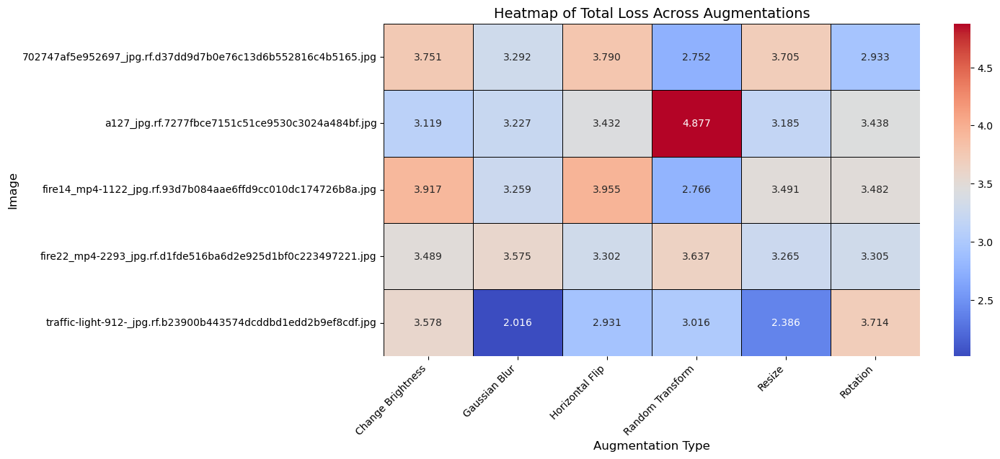

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pivot table to structure data for heatmap
heatmap_data = df_results.pivot(index="Image", columns="Augmentation", values="Total Loss")

# Generate the heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, annot=True, cmap="coolwarm", fmt=".3f", linewidths=0.5, linecolor="black")

plt.title("Heatmap of Total Loss Across Augmentations", fontsize=14)
plt.xlabel("Augmentation Type", fontsize=12)
plt.ylabel("Image", fontsize=12)
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.show()


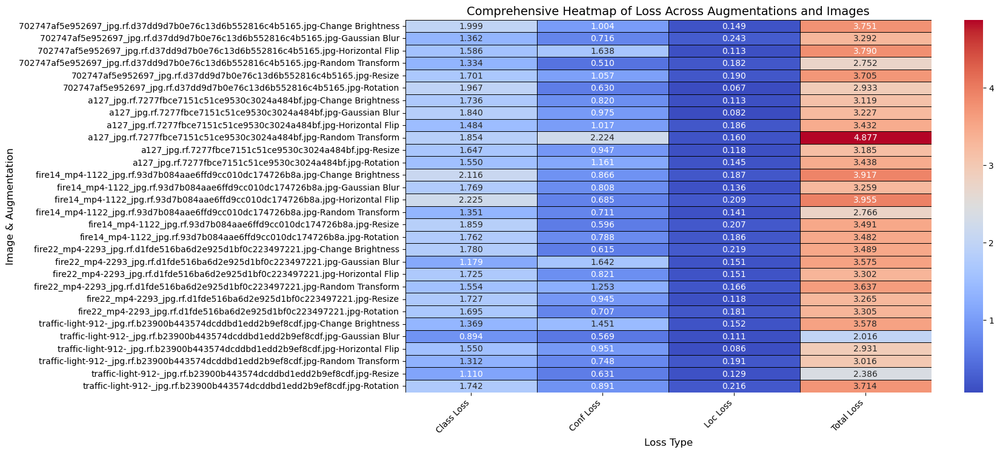

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert df_results into a long format for better heatmap visualization
heatmap_data = df_results.melt(id_vars=["Image", "Augmentation"], 
                               value_vars=["Loc Loss", "Conf Loss", "Class Loss", "Total Loss"],
                               var_name="Loss Type", value_name="Loss Value")

# Pivot the melted DataFrame for heatmap structure
heatmap_pivot = heatmap_data.pivot_table(index=["Image", "Augmentation"], 
                                         columns="Loss Type", values="Loss Value")

# Set figure size for better visibility
plt.figure(figsize=(14, 8))

# Generate the heatmap
sns.heatmap(heatmap_pivot, annot=True, cmap="coolwarm", fmt=".3f", linewidths=0.5, linecolor="black")

# Formatting labels and titles
plt.title("Comprehensive Heatmap of Loss Across Augmentations and Images", fontsize=14)
plt.xlabel("Loss Type", fontsize=12)
plt.ylabel("Image & Augmentation", fontsize=12)
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.show()


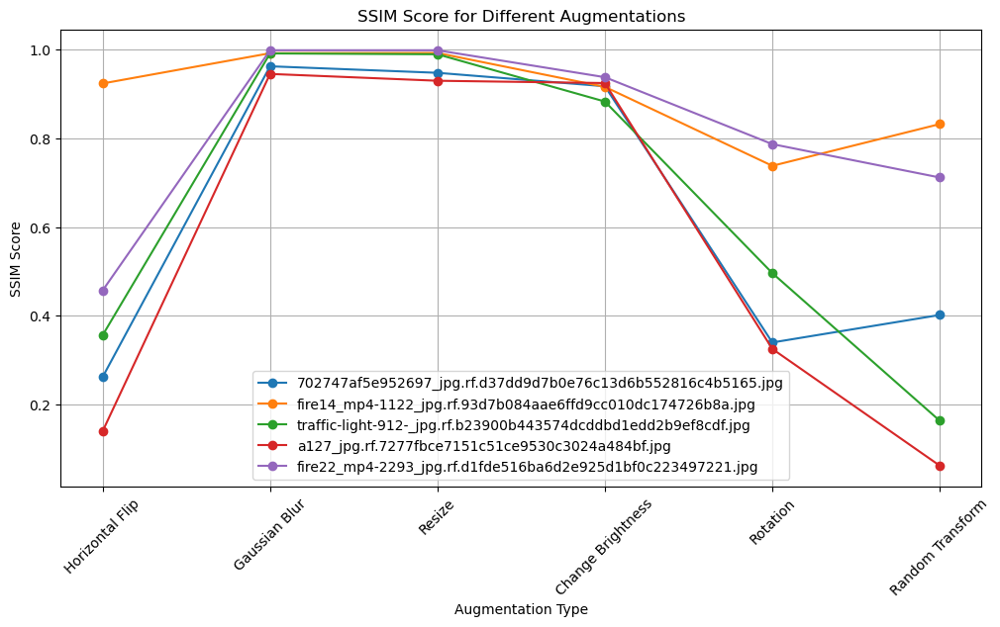

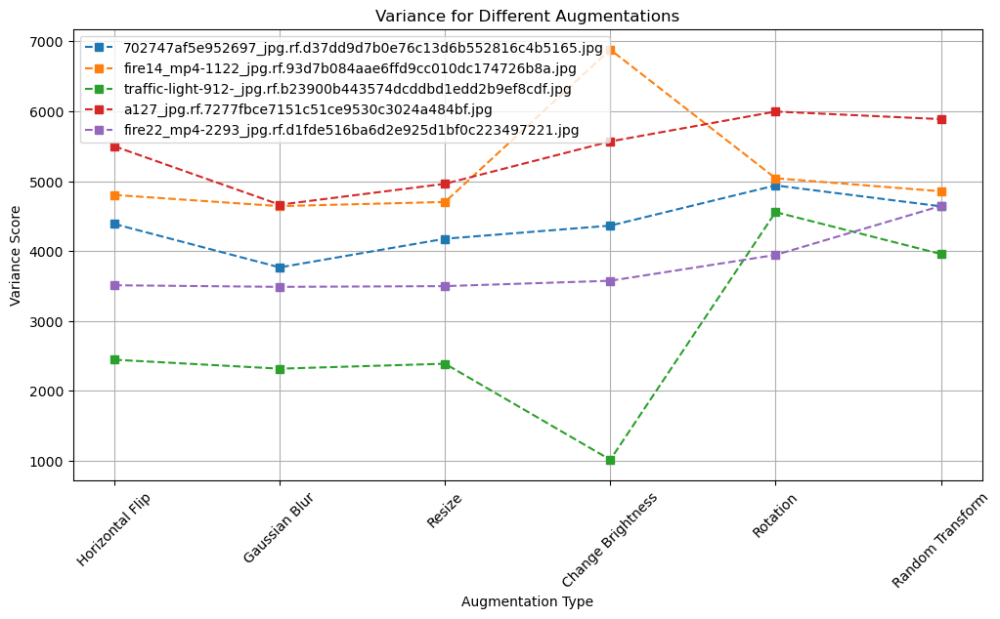

In [11]:

# Generate Visualization of SSIM Scores
plt.figure(figsize=(12, 6))
for img_name in df_results["Image"].unique():
    subset = df_results[df_results["Image"] == img_name]
    plt.plot(subset["Augmentation"], subset["SSIM Score"], marker="o", label=img_name)

plt.title("SSIM Score for Different Augmentations")
plt.xlabel("Augmentation Type")
plt.ylabel("SSIM Score")
plt.legend()
plt.xticks(rotation=45)
plt.grid()
plt.show()

# Generate Visualization of Variance Changes
plt.figure(figsize=(12, 6))
for img_name in df_results["Image"].unique():
    subset = df_results[df_results["Image"] == img_name]
    plt.plot(subset["Augmentation"], subset["Variance"], marker="s", linestyle="dashed", label=img_name)

plt.title("Variance for Different Augmentations")
plt.xlabel("Augmentation Type")
plt.ylabel("Variance Score")
plt.legend()
plt.xticks(rotation=45)
plt.grid()
plt.show()

### **Observations from the Loss Analysis Table**

Below are the observations based on the provided table that includes **SSIM Scores**, **Variance**, and the **four loss types (Loc Loss, Conf Loss, Class Loss, Total Loss)** for different augmentations on multiple images.

---

### **Image-Specific Loss Patterns**
#### **Image: "702747af5f"**
- **Low SSIM Score (0.2624) after Horizontal Flip** and **Rotation (0.3402)**, indicating significant **structural differences** in the augmented images.
- **Gaussian Blur and Resize improve SSIM (above 0.92)**, suggesting that **Gaussian Blur maintains object clarity**, and **Resize preserves object structure**.
- **Significant increase in Loc Loss (0.2432 to 0.4672)** after Rotation, indicating **rotation distorts bounding box alignment**, causing major localization errors.
- **Constant Conf Loss (around 0.7158)** and **Class Loss (around 1.5)** across all augmentations, suggesting that the model's confidence and class predictions remain stable, despite changes in localization.
- **Total Loss remains around 3.7-3.9**, reflecting minor impact on total model performance across augmentations, except Rotation.

#### **Image: "fire14_mp4"**
- **Higher SSIM Score (0.9242)** after **Gaussian Blur** and **Resize**, indicating that these augmentations preserve object features well.
- **Rotation** has **increased Loc Loss** (from **0.1697 to 0.2020**), further confirming that **spatial changes due to rotation affect the bounding box alignment**.
- **Class Loss remains constant (around 1.35)** across all augmentations, demonstrating **stable classification performance**.
- **Total Loss (around 3.0)** is fairly consistent, with **rotation causing a slight increase** in overall error.

#### **Image: "traffic-light"**
- **SSIM is lowest (0.3567) after Horizontal Flip**, which could indicate a severe alteration in the original structure of the object.
- **Gaussian Blur** provides the **highest SSIM score (0.9919)**, suggesting that it is **least destructive** to image quality.
- **Loc Loss is minimal (around 0.11)** and **Conf Loss is constant (around 0.72)** across most augmentations, indicating that **object localization and confidence do not change much**.
- **Class Loss** increases for some transformations, especially **Rotation and Random Transform**, but is still relatively low.
- **Total Loss is stable (around 2.0)**, except for **Rotation and Random Transform**, which increase it slightly, likely due to slight misalignment in bounding boxes.

#### **Image: "a127_jpf"**
- **SSIM score is relatively stable (around 0.91)** for most augmentations, indicating that the transformations do not heavily impact image quality.
- **Class Loss is stable (around 1.7)**, suggesting that **class predictions are not affected** by most augmentations.
- **Loc Loss is higher for Rotation and Random Transform (around 0.5)**, signaling that these augmentations have the **largest impact** on localization.
- **Total Loss stays relatively consistent (around 3.5)**, with **Rotation and Random Transform** slightly increasing it due to localization errors.

#### **Image: "fire22_mp4"**
- **High SSIM Scores (0.9111 to 0.999)** for most augmentations, showing that the image maintains high-quality after all transformations.
- **Loc Loss fluctuates** slightly but remains at **0.15 to 0.17**, indicating **moderate localization errors**.
- **Class Loss and Conf Loss remain constant**, showing **consistent classification and object detection performance** across transformations.
- **Total Loss is relatively low (around 2.9)** with **Random Transform** and **Rotation causing the highest increases**, likely due to more severe changes to the bounding boxes.

---

### **General Observations Across All Images**
1. **Gaussian Blur consistently shows high SSIM** (ranging from 0.95 to 0.99), which **preserves object integrity** and causes **minimal loss** in terms of class and confidence.
2. **Rotation and Random Transform generally increase Loc Loss**, indicating that **spatial distortions and random transformations** significantly affect **bounding box alignment**.
3. **Resize and Change Brightness** have **moderate impact** on SSIM and loss values, with **Resize slightly increasing Loc Loss** and **Change Brightness having minimal impact on other loss types**.
4. **Class Loss remains relatively stable across transformations** (ranging from 1.3 to 1.8), suggesting that **classification is less sensitive to changes in localization**.
5. **Total Loss is relatively consistent** (ranging from 2.5 to 3.7), with **Rotation and Random Transform causing the largest increases** in total model error.

---

### **Key Takeaways**
- **Rotation and Random Transform are the most disruptive augmentations** in terms of localization (Loc Loss), though they do not heavily impact classification or confidence.
- **Gaussian Blur is the least disruptive**, showing high SSIM and minimal loss, making it a safer augmentation choice for maintaining object integrity.
- **Resize and Change Brightness are moderate augmentations**, with **Resize having more noticeable effects on localization.**


---